In [2]:
import numpy as np
import pandas as pd
from pandas import Series, DataFrame

import chart_studio
import chart_studio.plotly as py
import chart_studio.tools as tls


import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter, FormatStrFormatter

import seaborn as sns
sns.set()

import plotly
import plotly.graph_objs as go#graph objects
import plotly.offline as offline
offline.init_notebook_mode(connected=True)

%matplotlib inline
plt.style.use("Solarize_Light2")

In [3]:
# Read the data of all the districts for  Condominiums and Apartments in Singapore(2017 to 2022)
df_singapore_condo_apt_data = pd.read_csv('singapore_districts_combined_dataset_condo_apt.csv') 

# delete S/N column
del df_singapore_condo_apt_data['S/N']

# Sort the price of property in ascending order according to Unit Price($psf).
df_singapore_condo_apt_data.sort_values(["Unit Price ($psf)"],axis=0,ascending=[False],inplace=True) 

# Describe the dataset
df_singapore_condo_apt_data.describe()


,Postal District,No. of Units,Price ($),Area (Sqft),Unit Price ($psf)
count,105934.000000,105934.000000,1.059340e+05,105934.000000,105934.000000
mean,13.865747,1.061718,1.792358e+06,1151.924245,1562.789916
std,6.810216,3.640613,9.667202e+06,6129.392036,540.717538
min,1.000000,1.000000,3.400000e+05,258.000000,280.000000
25%,9.000000,1.000000,1.000000e+06,678.000000,1197.000000
50%,15.000000,1.000000,1.323000e+06,947.000000,1491.000000
75%,19.000000,1.000000,1.776000e+06,1259.000000,1799.000000
max,28.000000,560.000000,9.800000e+08,947081.000000,6210.000000


In [4]:
# Returns the first 5 rows of dataset
df_singapore_condo_apt_data.head()

,Project Name,Street Name,Type,Postal District,Market Segment,Tenure,Type of Sale,No. of Units,Price ($),Nett Price ($),Area (Sqft),Type of Area,Floor Level,Unit Price ($psf),Date of Sale
22566,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,75000000,-,12077,Strata,01 to 05,6210,Oct-21
25439,EDEN,DRAYCOTT PARK,Apartment,10,CCR,Freehold,Resale,1,18287000,-,3035,Strata,21 to 25,6024,Mar-21
24587,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,39000000,-,6577,Strata,01 to 05,5930,May-21
24549,PARK NOVA,TOMLINSON ROAD,Apartment,10,CCR,Freehold,New Sale,1,34438000,-,5899,Strata,16 to 20,5838,May-21
21278,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,35000000,-,6049,Strata,01 to 05,5786,Dec-21


In [5]:
# datasets has 105934 rows and 15 columns
df_singapore_condo_apt_data.shape 

(105934, 15)

In [6]:
# Print a summary of the dataframe
df_singapore_condo_apt_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 105934 entries, 22566 to 61963
Data columns (total 15 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   Project Name       105934 non-null  object
 1   Street Name        105934 non-null  object
 2   Type               105934 non-null  object
 3   Postal District    105934 non-null  int64 
 4   Market Segment     105934 non-null  object
 5   Tenure             105932 non-null  object
 6   Type of Sale       105934 non-null  object
 7   No. of Units       105934 non-null  int64 
 8   Price ($)          105934 non-null  int64 
 9   Nett Price ($)     105934 non-null  object
 10  Area (Sqft)        105934 non-null  int64 
 11  Type of Area       105934 non-null  object
 12  Floor Level        105934 non-null  object
 13  Unit Price ($psf)  105934 non-null  int64 
 14  Date of Sale       105934 non-null  object
dtypes: int64(5), object(10)
memory usage: 12.9+ MB


In [7]:
# Observe the corelations within the dataframe
df_singapore_condo_apt_data.corr() 

,Postal District,No. of Units,Price ($),Area (Sqft),Unit Price ($psf)
Postal District,1.000000,-0.003214,-0.035954,-0.005095,-0.473432
No. of Units,-0.003214,1.000000,0.910905,0.985778,0.005612
Price ($),-0.035954,0.910905,1.000000,0.930535,0.081127
Area (Sqft),-0.005095,0.985778,0.930535,1.000000,-0.002421
Unit Price ($psf),-0.473432,0.005612,0.081127,-0.002421,1.000000


Text(0.5, 1.0, 'Singapore Condominiums and Apartments correlation matrix')

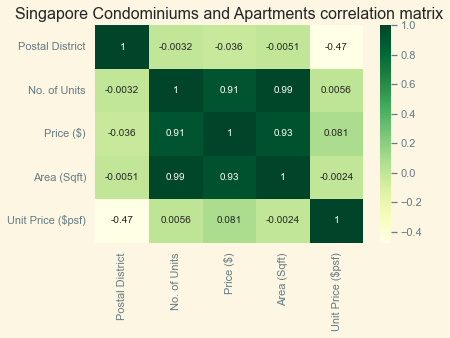

In [8]:
# Create the corerelation matrix using seaborn
sns.heatmap(df_singapore_condo_apt_data.corr(),cmap='YlGn',annot=True)

plt.title('Singapore Condominiums and Apartments correlation matrix')

##  *Data Cleaning - Missing Entries*

In [9]:
# Check for missing entries
df_singapore_condo_apt_data.isna().sum()

Project Name         0
Street Name          0
Type                 0
Postal District      0
Market Segment       0
Tenure               2
Type of Sale         0
No. of Units         0
Price ($)            0
Nett Price ($)       0
Area (Sqft)          0
Type of Area         0
Floor Level          0
Unit Price ($psf)    0
Date of Sale         0
dtype: int64

### Since 'Tenure' is in string format, a check is done to see which type of tenure has the most of number of units.

In [10]:
df_tenure = df_singapore_condo_apt_data.groupby(['Tenure'])['No. of Units'].sum().reset_index()
df_tenure.head(5)

,Tenure,No. of Units
0,100 yrs lease commencing from 1986,294
1,101 yrs lease commencing from 1985,565
2,102 yrs lease commencing from 1977,7
3,102 yrs lease commencing from 1978,36
4,102 yrs lease commencing from 1986,330


In [11]:
# Dataframe for 'Tenure' will be sorted to find the most common item in 'Tenure'.
df_tenure_sort = df_tenure.sort_values(["No. of Units"],axis=0,ascending=[False]) # Finding Most Common Item in Tenure 
df_tenure_sort.head(10)

,Tenure,No. of Units
121,Freehold,32923
70,99 yrs lease commencing from 2018,15263
71,99 yrs lease commencing from 2019,6263
69,99 yrs lease commencing from 2017,5485
68,99 yrs lease commencing from 2016,4708
63,99 yrs lease commencing from 2011,4607
64,99 yrs lease commencing from 2012,3438
67,99 yrs lease commencing from 2015,3301
66,99 yrs lease commencing from 2014,3044
62,99 yrs lease commencing from 2010,2685


In [12]:
# Replacement for missing entries
df_singapore_condo_apt_data['Tenure'].fillna(value="Freehold", inplace= True) 
df_singapore_condo_apt_data

,Project Name,Street Name,Type,Postal District,Market Segment,Tenure,Type of Sale,No. of Units,Price ($),Nett Price ($),Area (Sqft),Type of Area,Floor Level,Unit Price ($psf),Date of Sale
22566,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,75000000,-,12077,Strata,01 to 05,6210,Oct-21
25439,EDEN,DRAYCOTT PARK,Apartment,10,CCR,Freehold,Resale,1,18287000,-,3035,Strata,21 to 25,6024,Mar-21
24587,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,39000000,-,6577,Strata,01 to 05,5930,May-21
24549,PARK NOVA,TOMLINSON ROAD,Apartment,10,CCR,Freehold,New Sale,1,34438000,-,5899,Strata,16 to 20,5838,May-21
21278,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,35000000,-,6049,Strata,01 to 05,5786,Dec-21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91278,MAYFAIR PARK,JALAN BINGKA,Apartment,21,RCR,99 yrs lease commencing from 1952,Resale,1,400000,-,915,Strata,01 to 05,437,Jun-21
60017,RESIDENTIAL APARTMENTS,BALESTIER ROAD,Apartment,12,RCR,9999 yrs lease commencing from 1961,Resale,1,820000,-,1900,Strata,01 to 05,432,Mar-17
46345,RESIDENTIAL APARTMENTS,JOO CHIAT TERRACE,Apartment,15,RCR,Freehold,Resale,1,505000,-,1195,Strata,01 to 05,423,Jan-20
35044,RESIDENTIAL APARTMENTS,SING JOO WALK,Apartment,8,RCR,Freehold,Resale,1,525000,-,1499,Strata,01 to 05,350,Jul-17


In [13]:
# Check for replacement in missing entries
check_for_replacement = df_singapore_condo_apt_data.isna().sum()
print(check_for_replacement) 

Project Name         0
Street Name          0
Type                 0
Postal District      0
Market Segment       0
Tenure               0
Type of Sale         0
No. of Units         0
Price ($)            0
Nett Price ($)       0
Area (Sqft)          0
Type of Area         0
Floor Level          0
Unit Price ($psf)    0
Date of Sale         0
dtype: int64


## *Converting date and time* within dataframe.

In [14]:
# Check the data type of each column.
print (df_singapore_condo_apt_data)
print (df_singapore_condo_apt_data.dtypes)

                 Project Name        Street Name         Type  \
22566      LES MAISONS NASSIM        NASSIM ROAD  Condominium   
25439                    EDEN      DRAYCOTT PARK    Apartment   
24587      LES MAISONS NASSIM        NASSIM ROAD  Condominium   
24549               PARK NOVA     TOMLINSON ROAD    Apartment   
21278      LES MAISONS NASSIM        NASSIM ROAD  Condominium   
...                       ...                ...          ...   
91278            MAYFAIR PARK       JALAN BINGKA    Apartment   
60017  RESIDENTIAL APARTMENTS     BALESTIER ROAD    Apartment   
46345  RESIDENTIAL APARTMENTS  JOO CHIAT TERRACE    Apartment   
35044  RESIDENTIAL APARTMENTS      SING JOO WALK    Apartment   
61963  BEDOK SHOPPING COMPLEX         BEDOK ROAD    Apartment   

       Postal District Market Segment                               Tenure  \
22566               10            CCR                             Freehold   
25439               10            CCR                          

In [15]:
# Converting to Month and Year for Date of Sale.
df_singapore_condo_apt_data['Date of Sale'] = pd.to_datetime(df_singapore_condo_apt_data['Date of Sale'], format='%b-%y')

print (df_singapore_condo_apt_data)
print (df_singapore_condo_apt_data.dtypes)

                 Project Name        Street Name         Type  \
22566      LES MAISONS NASSIM        NASSIM ROAD  Condominium   
25439                    EDEN      DRAYCOTT PARK    Apartment   
24587      LES MAISONS NASSIM        NASSIM ROAD  Condominium   
24549               PARK NOVA     TOMLINSON ROAD    Apartment   
21278      LES MAISONS NASSIM        NASSIM ROAD  Condominium   
...                       ...                ...          ...   
91278            MAYFAIR PARK       JALAN BINGKA    Apartment   
60017  RESIDENTIAL APARTMENTS     BALESTIER ROAD    Apartment   
46345  RESIDENTIAL APARTMENTS  JOO CHIAT TERRACE    Apartment   
35044  RESIDENTIAL APARTMENTS      SING JOO WALK    Apartment   
61963  BEDOK SHOPPING COMPLEX         BEDOK ROAD    Apartment   

       Postal District Market Segment                               Tenure  \
22566               10            CCR                             Freehold   
25439               10            CCR                          

In [16]:
#format to month and year for the Date of Sale
df_singapore_condo_apt_data['Date of Sale'] = pd.to_datetime(df_singapore_condo_apt_data['Date of Sale'], format='%Y%m')

print (df_singapore_condo_apt_data)
print (df_singapore_condo_apt_data.dtypes)


                 Project Name        Street Name         Type  \
22566      LES MAISONS NASSIM        NASSIM ROAD  Condominium   
25439                    EDEN      DRAYCOTT PARK    Apartment   
24587      LES MAISONS NASSIM        NASSIM ROAD  Condominium   
24549               PARK NOVA     TOMLINSON ROAD    Apartment   
21278      LES MAISONS NASSIM        NASSIM ROAD  Condominium   
...                       ...                ...          ...   
91278            MAYFAIR PARK       JALAN BINGKA    Apartment   
60017  RESIDENTIAL APARTMENTS     BALESTIER ROAD    Apartment   
46345  RESIDENTIAL APARTMENTS  JOO CHIAT TERRACE    Apartment   
35044  RESIDENTIAL APARTMENTS      SING JOO WALK    Apartment   
61963  BEDOK SHOPPING COMPLEX         BEDOK ROAD    Apartment   

       Postal District Market Segment                               Tenure  \
22566               10            CCR                             Freehold   
25439               10            CCR                          

In [17]:
#Check the dataframe for change format in Date of Sale
df_singapore_condo_apt_data.head()

,Project Name,Street Name,Type,Postal District,Market Segment,Tenure,Type of Sale,No. of Units,Price ($),Nett Price ($),Area (Sqft),Type of Area,Floor Level,Unit Price ($psf),Date of Sale
22566,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,75000000,-,12077,Strata,01 to 05,6210,2021-10-01
25439,EDEN,DRAYCOTT PARK,Apartment,10,CCR,Freehold,Resale,1,18287000,-,3035,Strata,21 to 25,6024,2021-03-01
24587,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,39000000,-,6577,Strata,01 to 05,5930,2021-05-01
24549,PARK NOVA,TOMLINSON ROAD,Apartment,10,CCR,Freehold,New Sale,1,34438000,-,5899,Strata,16 to 20,5838,2021-05-01
21278,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,35000000,-,6049,Strata,01 to 05,5786,2021-12-01


In [18]:
# Perform inserting Year into dataframe
df_singapore_condo_apt_data['Year'] = df_singapore_condo_apt_data['Date of Sale'].dt.year
df_singapore_condo_apt_data.head()

,Project Name,Street Name,Type,Postal District,Market Segment,Tenure,Type of Sale,No. of Units,Price ($),Nett Price ($),Area (Sqft),Type of Area,Floor Level,Unit Price ($psf),Date of Sale,Year
22566,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,75000000,-,12077,Strata,01 to 05,6210,2021-10-01,2021
25439,EDEN,DRAYCOTT PARK,Apartment,10,CCR,Freehold,Resale,1,18287000,-,3035,Strata,21 to 25,6024,2021-03-01,2021
24587,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,39000000,-,6577,Strata,01 to 05,5930,2021-05-01,2021
24549,PARK NOVA,TOMLINSON ROAD,Apartment,10,CCR,Freehold,New Sale,1,34438000,-,5899,Strata,16 to 20,5838,2021-05-01,2021
21278,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,35000000,-,6049,Strata,01 to 05,5786,2021-12-01,2021


In [19]:
# Performing inserting Month into dataframe
df_singapore_condo_apt_data['Month'] = df_singapore_condo_apt_data['Date of Sale'].dt.month
#df_mth = df_singapore_condo_apt_data.head()
#df_mth
df_singapore_condo_apt_data

,Project Name,Street Name,Type,Postal District,Market Segment,Tenure,Type of Sale,No. of Units,Price ($),Nett Price ($),Area (Sqft),Type of Area,Floor Level,Unit Price ($psf),Date of Sale,Year,Month
22566,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,75000000,-,12077,Strata,01 to 05,6210,2021-10-01,2021,10
25439,EDEN,DRAYCOTT PARK,Apartment,10,CCR,Freehold,Resale,1,18287000,-,3035,Strata,21 to 25,6024,2021-03-01,2021,3
24587,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,39000000,-,6577,Strata,01 to 05,5930,2021-05-01,2021,5
24549,PARK NOVA,TOMLINSON ROAD,Apartment,10,CCR,Freehold,New Sale,1,34438000,-,5899,Strata,16 to 20,5838,2021-05-01,2021,5
21278,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,35000000,-,6049,Strata,01 to 05,5786,2021-12-01,2021,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91278,MAYFAIR PARK,JALAN BINGKA,Apartment,21,RCR,99 yrs lease commencing from 1952,Resale,1,400000,-,915,Strata,01 to 05,437,2021-06-01,2021,6
60017,RESIDENTIAL APARTMENTS,BALESTIER ROAD,Apartment,12,RCR,9999 yrs lease commencing from 1961,Resale,1,820000,-,1900,Strata,01 to 05,432,2017-03-01,2017,3
46345,RESIDENTIAL APARTMENTS,JOO CHIAT TERRACE,Apartment,15,RCR,Freehold,Resale,1,505000,-,1195,Strata,01 to 05,423,2020-01-01,2020,1
35044,RESIDENTIAL APARTMENTS,SING JOO WALK,Apartment,8,RCR,Freehold,Resale,1,525000,-,1499,Strata,01 to 05,350,2017-07-01,2017,7


In [20]:
# Export a Pandas Dataframe to CSV without an Index
df_singapore_condo_apt_data.to_csv(r'C:/Users/raufy/OneDrive/Documents/private_pty_compiled_3.csv', index = False)
print (df_singapore_condo_apt_data)

                 Project Name        Street Name         Type  \
22566      LES MAISONS NASSIM        NASSIM ROAD  Condominium   
25439                    EDEN      DRAYCOTT PARK    Apartment   
24587      LES MAISONS NASSIM        NASSIM ROAD  Condominium   
24549               PARK NOVA     TOMLINSON ROAD    Apartment   
21278      LES MAISONS NASSIM        NASSIM ROAD  Condominium   
...                       ...                ...          ...   
91278            MAYFAIR PARK       JALAN BINGKA    Apartment   
60017  RESIDENTIAL APARTMENTS     BALESTIER ROAD    Apartment   
46345  RESIDENTIAL APARTMENTS  JOO CHIAT TERRACE    Apartment   
35044  RESIDENTIAL APARTMENTS      SING JOO WALK    Apartment   
61963  BEDOK SHOPPING COMPLEX         BEDOK ROAD    Apartment   

       Postal District Market Segment                               Tenure  \
22566               10            CCR                             Freehold   
25439               10            CCR                          

## 1. Private Residential Property Price Index Observation

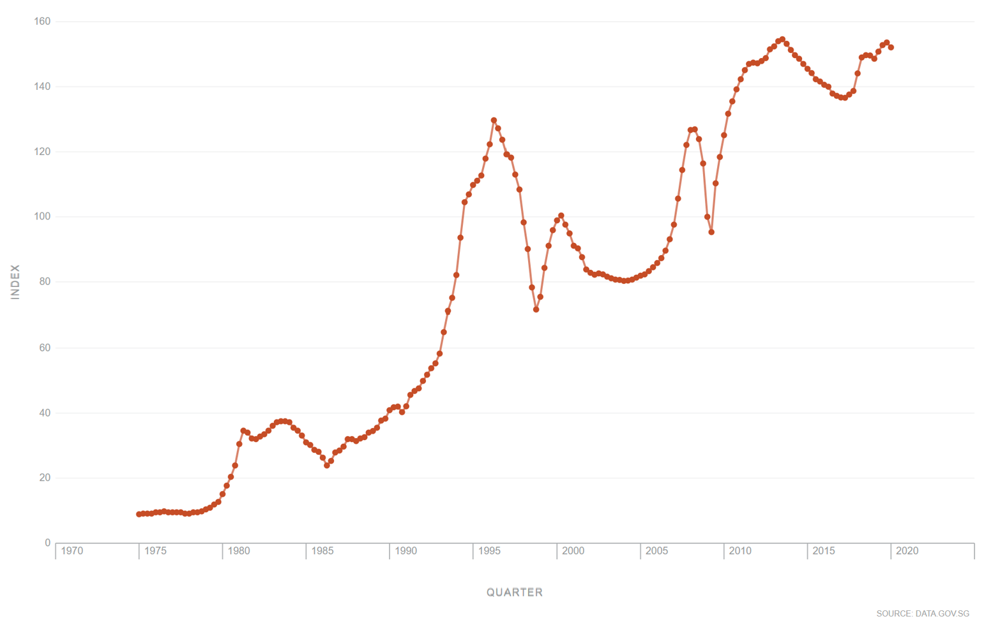

**Source** - https://data.gov.sg/dataset/private-residential-property-price-index-by-type-of-property

## 2. Study the trend for transactions in terms of number of units within the districts for last 5 years.

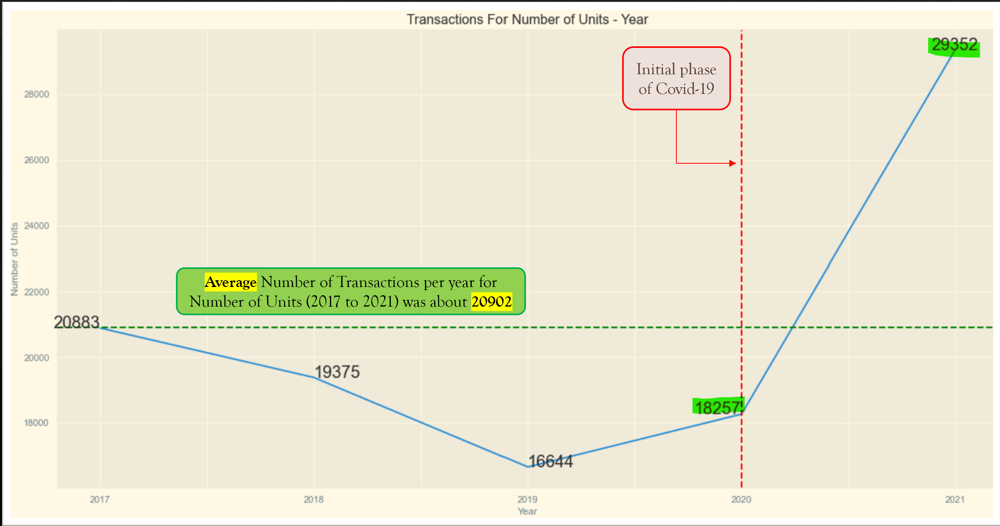

In [21]:
# Study the trend for transactions in terms of number of units within the districts for Year.
df_year = df_singapore_condo_apt_data['Year'].value_counts()
print(df_year)
print("The total number of units sold :", df_singapore_condo_apt_data['Year'].value_counts().sum())


2021    29352
2017    20883
2018    19375
2020    18257
2019    16644
2022     1423
Name: Year, dtype: int64
The total number of units sold : 105934


In [22]:
# Remove the Year 2022 since it has smaller number as compared to other years
df_year_remove = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] !=2022 )].Year.value_counts().sort_index()
df_year_remove

2017    20883
2018    19375
2019    16644
2020    18257
2021    29352
Name: Year, dtype: int64

In [23]:
# Creating index for plot
df_year_remove.index = ['2017', '2018', '2019', '2020','2021']
df_year_remove

2017    20883
2018    19375
2019    16644
2020    18257
2021    29352
Name: Year, dtype: int64

In [24]:
df_avg_month = df_year_remove.mean()
df_avg_month
print("The average number of transactions for number of units(2017 to 2021) is", df_avg_month)


The average number of transactions for number of units(2017 to 2021) is 20902.2


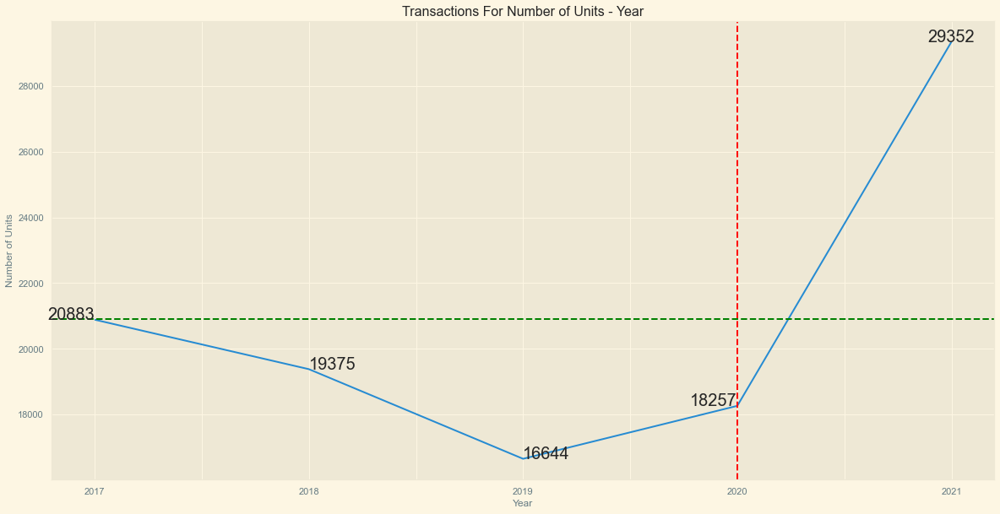

In [25]:
# Plot the graph to study the trnd in the number of units sold within the years.
df_year_remove.plot(x='Year', figsize=(20,10), title = "Transactions For Number of Units - Year")
plt.ylabel('Number of Units')
plt.xlabel('Year')
plt.text(0,df_year_remove[0],'20883',ha='right',fontsize=20)
plt.text(1,df_year_remove[1],'19375',ha='left',fontsize=20)
plt.text(2,df_year_remove[2],'16644',ha='left',fontsize=20)
plt.text(3,df_year_remove[3],'18257',ha='right',fontsize=20)
plt.text(4,df_year_remove[4],'29352',ha='center',fontsize=20)
plt.axvline(x=3, color='red', linestyle='--')
plt.axhline(y=20902, color='green', linestyle='--')


In [26]:
# Setting index to 'Project Name'
df_singapore_condo_apt_data.set_index('Project Name')

,Street Name,Type,Postal District,Market Segment,Tenure,Type of Sale,No. of Units,Price ($),Nett Price ($),Area (Sqft),Type of Area,Floor Level,Unit Price ($psf),Date of Sale,Year,Month
Project Name,,,,,,,,,,,,,,,,
LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,75000000,-,12077,Strata,01 to 05,6210,2021-10-01,2021,10
EDEN,DRAYCOTT PARK,Apartment,10,CCR,Freehold,Resale,1,18287000,-,3035,Strata,21 to 25,6024,2021-03-01,2021,3
LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,39000000,-,6577,Strata,01 to 05,5930,2021-05-01,2021,5
PARK NOVA,TOMLINSON ROAD,Apartment,10,CCR,Freehold,New Sale,1,34438000,-,5899,Strata,16 to 20,5838,2021-05-01,2021,5
LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,35000000,-,6049,Strata,01 to 05,5786,2021-12-01,2021,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MAYFAIR PARK,JALAN BINGKA,Apartment,21,RCR,99 yrs lease commencing from 1952,Resale,1,400000,-,915,Strata,01 to 05,437,2021-06-01,2021,6
RESIDENTIAL APARTMENTS,BALESTIER ROAD,Apartment,12,RCR,9999 yrs lease commencing from 1961,Resale,1,820000,-,1900,Strata,01 to 05,432,2017-03-01,2017,3
RESIDENTIAL APARTMENTS,JOO CHIAT TERRACE,Apartment,15,RCR,Freehold,Resale,1,505000,-,1195,Strata,01 to 05,423,2020-01-01,2020,1


In [27]:
# Calculating % for the most number units sold in terms of year. The % will be included in plot 

max_year = df_singapore_condo_apt_data['Year'].value_counts()
df_2017 =df_year_remove.iloc[0]
df_2018 =df_year_remove.iloc[1]
df_2019 =df_year_remove.iloc[2]
df_2020 =df_year_remove.iloc[3]
df_2021 =df_year_remove.iloc[4]


tot_year_count = df_singapore_condo_apt_data['Project Name'].count()
percent_17 = round((df_2017/tot_year_count)*100,2)
percent_18 = round((df_2018/tot_year_count)*100,2)
percent_19 = round((df_2019/tot_year_count)*100,2)
percent_20 = round((df_2020/tot_year_count)*100,2)
percent_21 = round((df_2021/tot_year_count)*100,2)

print("Percentage of total number of units - 2017 is", percent_17,"%")
print("Percentage of total number of units - 2018 is", percent_18,"%")
print("Percentage of total number of units - 2019 is", percent_19,"%")
print("Percentage of total number of units - 2020 is", percent_20,"%")
print("Percentage of total number of units - 2021 is", percent_21,"%")

Percentage of total number of units - 2017 is 19.71 %
Percentage of total number of units - 2018 is 18.29 %
Percentage of total number of units - 2019 is 15.71 %
Percentage of total number of units - 2020 is 17.23 %
Percentage of total number of units - 2021 is 27.71 %


In [28]:
# Plotting Bar graph for Transactions For Number of Units - Year
#plt.style.use("Solarize_Light2")
#df_year_remove_plt = df_year_remove.plot(kind='bar',color = "orange", ec="grey", figsize=(20,10), title= "Transactions For Number of Units - Year")
#plt.xlabel('Year')
#plt.text(0,df_year_remove[0],'19.71%',ha='center',fontsize=15)
#plt.text(1,df_year_remove[1],'18.29%',ha='center',fontsize=15)
#plt.text(2,df_year_remove[2],'15.71%',ha='center',fontsize=15)
#plt.text(3,df_year_remove[3],'17.23%',ha='center',fontsize=15)
#plt.text(4,df_year_remove[4],'27.71%',ha='center',fontsize=15)

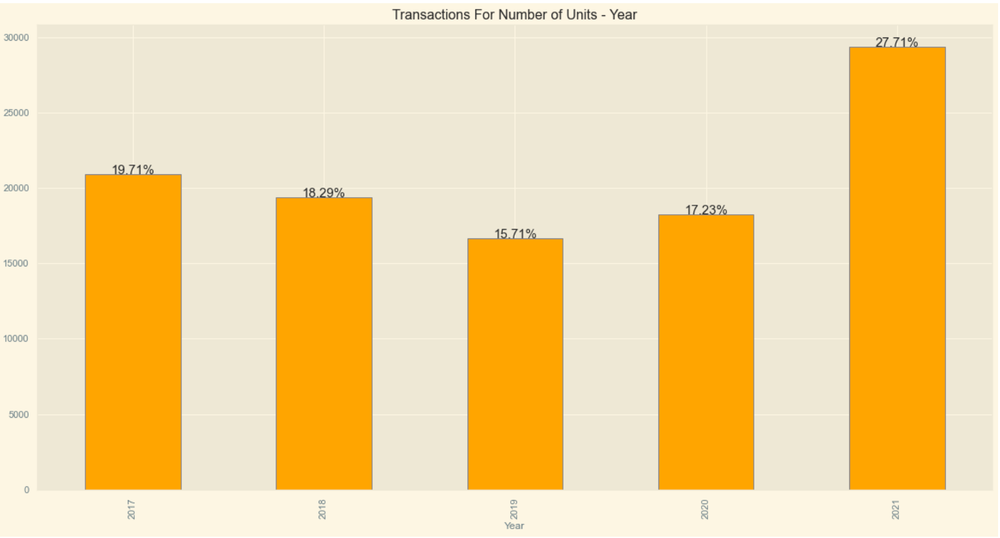

## 3. Trends and Analysis

## Creating Parallel Coordinates Plots for Analysis 

From the Parallel Coordinates Plot, we can observe that there is a high volume in the number of transactions within the number of units. And the highest Unit Price is $6210 per square feet.

In [29]:
import plotly.express as px
import pandas as pd
df_singapore_condo_apt_data

fig = px.parallel_coordinates(
    df_singapore_condo_apt_data,
    dimensions=[
        'Unit Price ($psf)', 'Price ($)','No. of Units', 'Postal District','Year', 
    ],
    color='Year',
    color_continuous_scale=px.colors.sequential.Emrld)
fig.show()

In [30]:
# Creating Parallel Coordinates Plot for Unit Price less than $3000
df_un_lesser = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Unit Price ($psf)"] < 3000 )]
df_un_lesser

,Project Name,Street Name,Type,Postal District,Market Segment,Tenure,Type of Sale,No. of Units,Price ($),Nett Price ($),Area (Sqft),Type of Area,Floor Level,Unit Price ($psf),Date of Sale,Year,Month
35356,ARDMORE PARK,ARDMORE PARK,Condominium,10,CCR,Freehold,Resale,1,8650000,-,2885,Strata,16 to 20,2999,2017-06-01,2017,6
21749,CANNINGHILL PIERS,CLARKE QUAY,Apartment,6,RCR,99 yrs lease commencing from 2021,New Sale,1,2841000,-,947,Strata,31 to 35,2999,2021-11-01,2021,11
29502,MIDTOWN BAY,BEACH ROAD,Apartment,7,CCR,99 yrs lease commencing from 2018,New Sale,1,1423400,1387400,463,Strata,16 to 20,2998,2019-10-01,2019,10
25939,THE ATELIER,MAKEWAY AVENUE,Apartment,9,CCR,Freehold,New Sale,1,4485000,-,1496,Strata,16 to 20,2998,2021-03-01,2021,3
25336,NOUVEL 18,ANDERSON ROAD,Condominium,10,CCR,Freehold,Resale,1,8456000,-,2820,Strata,16 to 20,2998,2021-03-01,2021,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91278,MAYFAIR PARK,JALAN BINGKA,Apartment,21,RCR,99 yrs lease commencing from 1952,Resale,1,400000,-,915,Strata,01 to 05,437,2021-06-01,2021,6
60017,RESIDENTIAL APARTMENTS,BALESTIER ROAD,Apartment,12,RCR,9999 yrs lease commencing from 1961,Resale,1,820000,-,1900,Strata,01 to 05,432,2017-03-01,2017,3
46345,RESIDENTIAL APARTMENTS,JOO CHIAT TERRACE,Apartment,15,RCR,Freehold,Resale,1,505000,-,1195,Strata,01 to 05,423,2020-01-01,2020,1
35044,RESIDENTIAL APARTMENTS,SING JOO WALK,Apartment,8,RCR,Freehold,Resale,1,525000,-,1499,Strata,01 to 05,350,2017-07-01,2017,7


In [31]:
#import plotly.express as px
#import pandas as pd
#df_un_lesser

#fig = px.parallel_coordinates(
    #df_un_lesser,
    #dimensions=[
        #'Unit Price ($psf)', 'Price ($)','No. of Units', 'Postal District','Year', 
    #],
    #color='Year',
    #color_continuous_scale=px.colors.sequential.Emrld)
#fig.show()

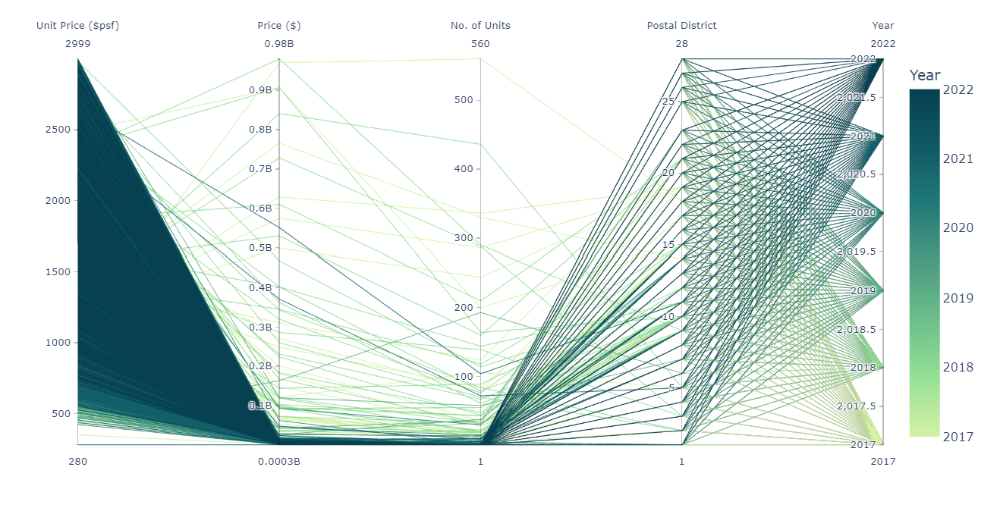

In [32]:
# Creating Parallel Coordinates Plot for Unit Price more than $3000
df_un_more = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Unit Price ($psf)"] > 3000 )]
df_un_more

,Project Name,Street Name,Type,Postal District,Market Segment,Tenure,Type of Sale,No. of Units,Price ($),Nett Price ($),Area (Sqft),Type of Area,Floor Level,Unit Price ($psf),Date of Sale,Year,Month
22566,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,75000000,-,12077,Strata,01 to 05,6210,2021-10-01,2021,10
25439,EDEN,DRAYCOTT PARK,Apartment,10,CCR,Freehold,Resale,1,18287000,-,3035,Strata,21 to 25,6024,2021-03-01,2021,3
24587,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,39000000,-,6577,Strata,01 to 05,5930,2021-05-01,2021,5
24549,PARK NOVA,TOMLINSON ROAD,Apartment,10,CCR,Freehold,New Sale,1,34438000,-,5899,Strata,16 to 20,5838,2021-05-01,2021,5
21278,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,35000000,-,6049,Strata,01 to 05,5786,2021-12-01,2021,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31967,NASSIM PARK RESIDENCES,NASSIM ROAD,Condominium,10,CCR,Freehold,Resale,1,20800000,-,6932,Strata,01 to 05,3001,2018-06-01,2018,6
22548,15 HOLLAND HILL,HOLLAND HILL,Apartment,10,CCR,Freehold,New Sale,1,5587900,-,1862,Strata,06 to 10,3001,2021-10-01,2021,10
35017,GRAMERCY PARK,GRANGE ROAD,Condominium,10,CCR,Freehold,Resale,1,3812000,-,1270,Strata,11 to 15,3001,2017-07-01,2017,7
28779,8 SAINT THOMAS,ST. THOMAS WALK,Condominium,9,CCR,Freehold,Resale,1,3908000,-,1302,Strata,11 to 15,3001,2020-01-01,2020,1


In [33]:
#import plotly.express as px
#import pandas as pd
#df_un_more

#fig = px.parallel_coordinates(
    #df_un_more,
    #dimensions=[
        #'Unit Price ($psf)', 'Price ($)','No. of Units', 'Postal District','Year', 
    #],
    #color='Year',
    #color_continuous_scale=px.colors.sequential.Emrld)
#fig.show()

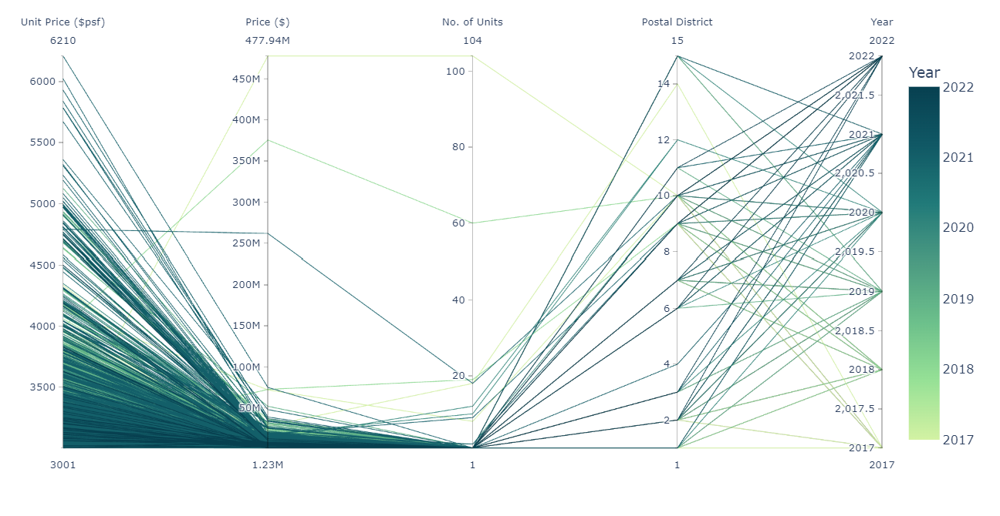

## 4. Using Unit Price ($psf) median for analysis

In [34]:
#Groupby the Unit Price and Number of Units
df_unit_v_no = df_singapore_condo_apt_data.groupby(['Unit Price ($psf)'])['No. of Units'].sum().reset_index()
df_unit_v_no.head(5)

,Unit Price ($psf),No. of Units
0,280,1
1,350,1
2,423,1
3,432,1
4,437,1


In [35]:
# Sorting according to number of units for Unit Price($psf)
df_sort = df_unit_v_no.sort_values(["No. of Units"],axis=0,ascending=[False]).reset_index()
df_sort.head(5)

,index,Unit Price ($psf),No. of Units
0,513,1024,618
1,825,1336,510
2,860,1371,438
3,605,1116,394
4,888,1399,388


In [36]:
# Finding the maximum value for both Unit price and number of units
df_unit_v_no.max()

Unit Price ($psf)    6210
No. of Units          618
dtype: int64

In [37]:
# df_unit_v_no dataset has 3325 rows and 2 columns
df_unit_v_no.shape

(3325, 2)

In [38]:
# Creating for analysis for mean and median
#sns.histplot(df_singapore_condo_apt_data['Unit Price ($psf)'],kde=False, bins=30)

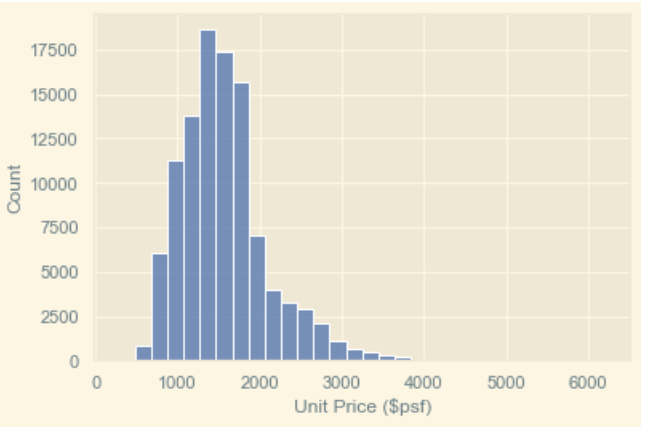

## Histogram Analysis

The graph indicates a Right Skewed histogram and the mean is more than median. Most of the units transacted are in the range of about 1000 to 2000 dollars per square feet. Thus, for our analysis in the dataset, using median might be more suitable for our analysis.


## 5. Unit Price($psf) Analysis - (mean and median) 

In [39]:
# Unit Price Analysis - Jan 2017 to Jan 2022 (mean and median)
total_mean_u  = df_singapore_condo_apt_data['Unit Price ($psf)'].mean(axis=0)
total_median_u  = df_singapore_condo_apt_data['Unit Price ($psf)'].median(axis=0)

print("The mean Unit Price ($psf) of property in all districts is:$", round(total_mean_u,2)) # mean
print("The median Unit Price ($psf) of property in all districts is:$", round(total_median_u,2)) # median

The mean Unit Price ($psf) of property in all districts is:$ 1562.79
The median Unit Price ($psf) of property in all districts is:$ 1491.0


In [40]:
# Comparing the median Unit Price ($psf) from 2017 to 2021
y17 = 2017
y18 = 2018
y19 = 2019
y20 = 2020
y21 = 2021

year2017 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2017 )]
year2018 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2018 )]
year2019 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2019 )]
year2020 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2020 )]
year2021 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2021 )]


median_17 = year2017['Unit Price ($psf)'].median()
median_18 = year2018['Unit Price ($psf)'].median()
median_19 = year2019['Unit Price ($psf)'].median()
median_20 = year2020['Unit Price ($psf)'].median()
median_21 = year2021['Unit Price ($psf)'].median()

print("The median price in all districts is $", round(total_median_u,2)) # median
print("The median price for the year", y17, "is $", round(median_17,2) )
print("The median price for the year", y18, "is $", round(median_18,2) )
print("The median price for the year", y19, "is $", round(median_19,2) )
print("The median price for the year", y20, "is $", round(median_20,2) )
print("The median price for the year", y21, "is $", round(median_21,2) )


The median price in all districts is $ 1491.0
The median price for the year 2017 is $ 1346.0
The median price for the year 2018 is $ 1418.0
The median price for the year 2019 is $ 1515.0
The median price for the year 2020 is $ 1552.0
The median price for the year 2021 is $ 1610.0


In [41]:
# Comparing the mean Unit Price ($psf) from 2017 to 2021
y17 = 2017
y18 = 2018
y19 = 2019
y20 = 2020
y21 = 2021

total_median_price  = df_singapore_condo_apt_data['Price ($)'].median(axis=0)
year2017 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2017 )]
year2018 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2018 )]
year2019 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2019 )]
year2020 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2020 )]
year2021 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2021 )]

mean_17 = year2017['Unit Price ($psf)'].mean()
mean_18 = year2018['Unit Price ($psf)'].mean()
mean_19 = year2019['Unit Price ($psf)'].mean()
mean_20 = year2020['Unit Price ($psf)'].mean()
mean_21 = year2021['Unit Price ($psf)'].mean()

print("The median Unit Price ($psf) of property in all districts is:$", round(total_mean_u,2)) # median
print("The median Unit Price ($psf) for the year", y17, "is $", round(mean_17,2) )
print("The median Unit Price ($psf) for the year", y18, "is $", round(mean_18,2) )
print("The median Unit Price ($psf) for the year", y19, "is $", round(mean_19,2) )
print("The median Unit Price ($psf) for the year", y20, "is $", round(mean_20,2) )
print("The median Unit Price ($psf) for the year", y21, "is $", round(mean_21,2) )



The median Unit Price ($psf) of property in all districts is:$ 1562.79
The median Unit Price ($psf) for the year 2017 is $ 1404.46
The median Unit Price ($psf) for the year 2018 is $ 1486.61
The median Unit Price ($psf) for the year 2019 is $ 1606.84
The median Unit Price ($psf) for the year 2020 is $ 1577.3
The median Unit Price ($psf) for the year 2021 is $ 1681.45


In [42]:
#Creating table for mean median price comparison
import pandas as pd
from tabulate import tabulate

# creating a DataFrame
dict_district = {'Year' : ['2017 ', '2018', '2019', '2020', "2021"],
        'Mean Price ($)' : [mean_17, mean_18, mean_19,mean_20,mean_21 ],
        'Median Price ($)' : [median_17, median_18, median_19,median_20,median_21 ]
        
       }
dataframe3 = pd.DataFrame(dict_district)

  
# displaying the DataFrame
dataframe3
dataframe3.style.background_gradient()

#dataframe1.style.highlight_max(color = 'lightgreen', axis = 0)
#print(tabulate(dataframe1, headers = 'keys', tablefmt = 'pretty'))

,Year,Mean Price ($),Median Price ($)
0,2017,1404.460374,1346.000000
1,2018,1486.608258,1418.000000
2,2019,1606.844268,1515.000000
3,2020,1577.298461,1552.000000
4,2021,1681.446409,1610.000000


Text(0, 0.5, 'Price ($)')

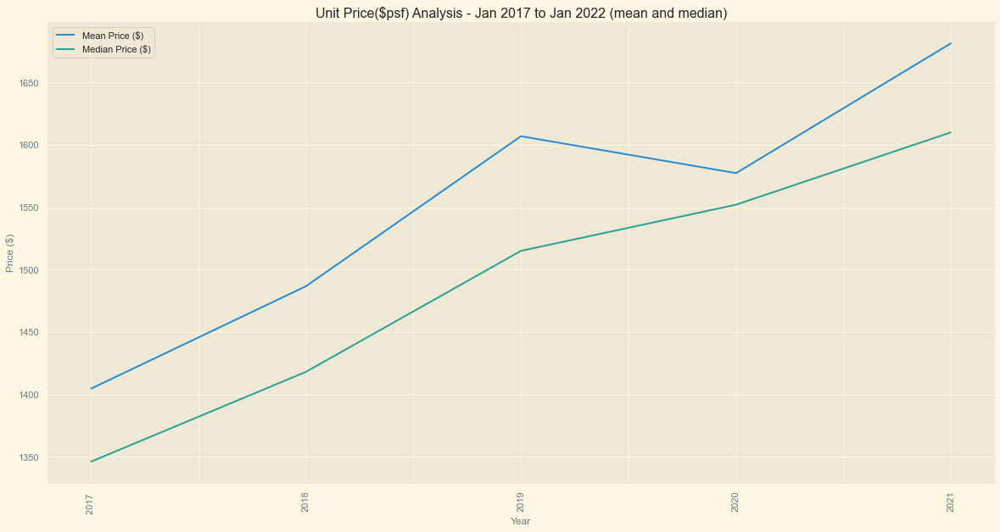

In [43]:
#Plotting mean and median for Unit Price ($psf)
dataframe3.plot(x = "Year",figsize=(20,10),  rot = 90, title = 'Unit Price($psf) Analysis - Jan 2017 to Jan 2022 (mean and median)')
plt.ylabel('Price ($)')

Text(0, 0.5, 'Price ($)')

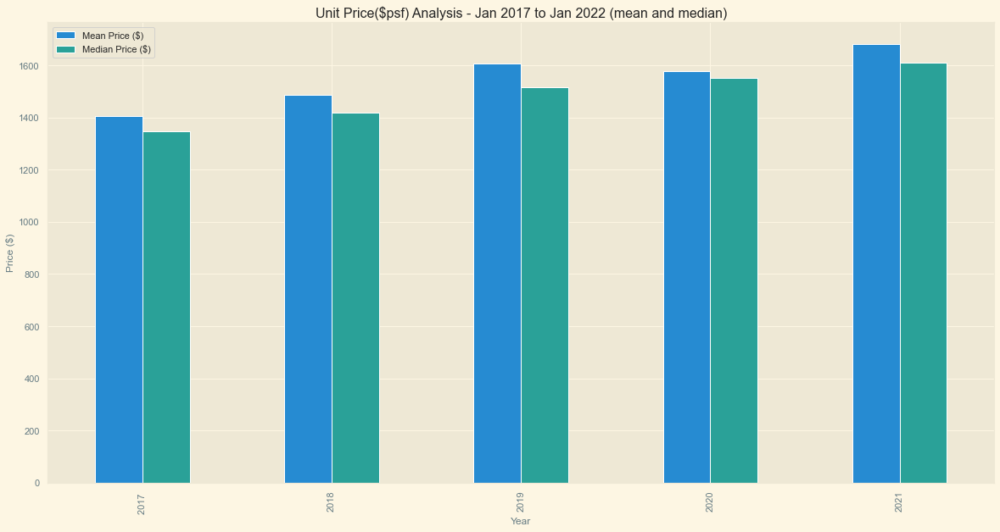

In [44]:
#Plotting mean and median for Unit Price ($psf) - bar
dataframe3.plot(kind = "bar", x = "Year",figsize=(20,10),  rot = 90, title = 'Unit Price($psf) Analysis - Jan 2017 to Jan 2022 (mean and median)')
plt.ylabel('Price ($)')

## Comparing the  maximum and minimun Unit Price

In [45]:
# Comparing the max Unit Price ($psf) from 2017 to 2021
y17 = 2017
y18 = 2018
y19 = 2019
y20 = 2020
y21 = 2021

year2017 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2017 )]
year2018 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2018 )]
year2019 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2019 )]
year2020 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2020 )]
year2021 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2021 )]

max_17 = year2017['Unit Price ($psf)'].max()
max_18 = year2018['Unit Price ($psf)'].max()
max_19 = year2019['Unit Price ($psf)'].max()
max_20 = year2020['Unit Price ($psf)'].max()
max_21 = year2021['Unit Price ($psf)'].max()

print("The max Unit Price ($psf) for the year", y17, "is $", round(max_17,2) )
print("The max Unit Price ($psf) for the year", y18, "is $", round(max_18,2) )
print("The max Unit Price ($psf) for the year", y19, "is $", round(max_19,2) )
print("The max Unit Price ($psf) for the year", y20, "is $", round(max_20,2) )
print("The max Unit Price ($psf) for the year", y21, "is $", round(max_21,2) )



The max Unit Price ($psf) for the year 2017 is $ 4335
The max Unit Price ($psf) for the year 2018 is $ 4630
The max Unit Price ($psf) for the year 2019 is $ 5125
The max Unit Price ($psf) for the year 2020 is $ 4987
The max Unit Price ($psf) for the year 2021 is $ 6210


In [46]:
# Comparing the min Unit Price ($psf) from 2017 to 2021
y17 = 2017
y18 = 2018
y19 = 2019
y20 = 2020
y21 = 2021

year2017 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2017 )]
year2018 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2018 )]
year2019 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2019 )]
year2020 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2020 )]
year2021 = df_singapore_condo_apt_data[(df_singapore_condo_apt_data["Year"] ==2021 )]

min_17 = year2017['Unit Price ($psf)'].min()
min_18 = year2018['Unit Price ($psf)'].min()
min_19 = year2019['Unit Price ($psf)'].min()
min_20 = year2020['Unit Price ($psf)'].min()
min_21 = year2021['Unit Price ($psf)'].min()

print("The min Unit Price ($psf) for the year", y17, "is $", round(min_17,2) )
print("The min Unit Price ($psf) for the year", y18, "is $", round(min_18,2) )
print("The min Unit Price ($psf) for the year", y19, "is $", round(min_19,2) )
print("The min Unit Price ($psf) for the year", y20, "is $", round(min_20,2) )
print("The min Unit Price ($psf) for the year", y21, "is $", round(min_21,2) )



The min Unit Price ($psf) for the year 2017 is $ 350
The min Unit Price ($psf) for the year 2018 is $ 448
The min Unit Price ($psf) for the year 2019 is $ 461
The min Unit Price ($psf) for the year 2020 is $ 423
The min Unit Price ($psf) for the year 2021 is $ 280


In [47]:
#Creating table for max and min price comparison
import pandas as pd
from tabulate import tabulate

# creating a DataFrame
dict_district = {'Year' : ['2017 ', '2018', '2019', '2020', "2021"],
        'Minimum Price ($)' : [max_17, max_18, max_19,max_20,max_21 ],
        'Maximum Price ($)' : [min_17, min_18, min_19,min_20,min_21 ]
        
       }
dataframe3 = pd.DataFrame(dict_district)

  
# displaying the DataFrame
dataframe3
dataframe3.style.background_gradient()

#dataframe1.style.highlight_max(color = 'lightgreen', axis = 0)
#print(tabulate(dataframe1, headers = 'keys', tablefmt = 'pretty'))

,Year,Minimum Price ($),Maximum Price ($)
0,2017,4335,350
1,2018,4630,448
2,2019,5125,461
3,2020,4987,423
4,2021,6210,280


Text(0, 0.5, 'Price ($)')

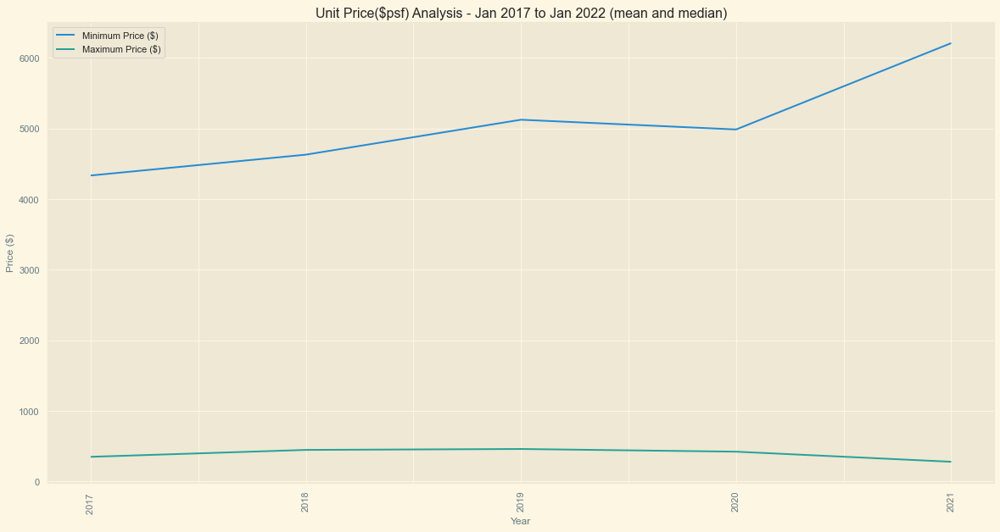

In [48]:
#Plotting max and min for Unit Price ($psf)
dataframe3.plot(x = "Year",figsize=(20,10),  rot = 90, title = 'Unit Price($psf) Analysis - Jan 2017 to Jan 2022 (mean and median)')
plt.ylabel('Price ($)')

Text(0, 0.5, 'Price ($)')

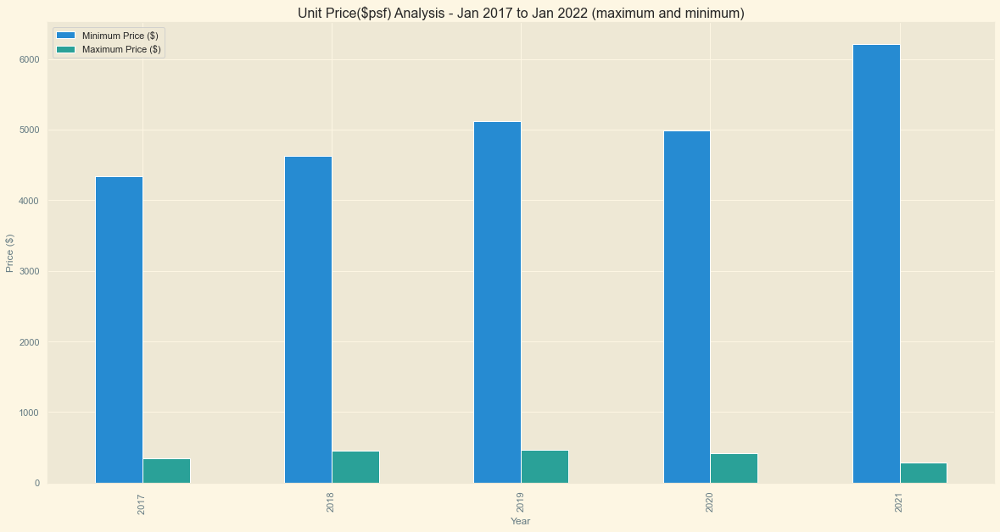

In [49]:
#Plotting max and min for Unit Price ($psf)
dataframe3.plot(kind = "bar", x = "Year",figsize=(20,10),  rot = 90, title = 'Unit Price($psf) Analysis - Jan 2017 to Jan 2022 (maximum and minimum)')
plt.ylabel('Price ($)')

## Unit Price($psf) Analysis - (mean and median) 

- The graph shows that price for both mean and median are falling each other and there are no clear outliers. The median and mean are on upward trend. The mean price went down in 2020 but 2021 has the highest mean and median prices. 


<AxesSubplot:xlabel='Year', ylabel='Unit Price ($psf)'>

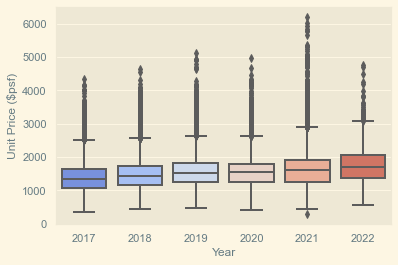

In [50]:
# Creating boxplot to see trend for median
sns.boxplot(x="Year", y="Unit Price ($psf)", data=df_singapore_condo_apt_data, palette="coolwarm")

## 2017 to 2022 - Unit Price ($psf) observation using plotly for data visualization.

In [51]:
# Plotly to analyze the Unit Price ($psf) - 2017 to 2022 dataset
#trace0_1_overall = go.Box(y = df_singapore_condo_apt_data['Unit Price ($psf)'], 
                #name = 'Unit Price ($psf)',
               #marker_color = 'lightseagreen')

In [52]:
#data = [trace0_1_overall]

#offline.iplot(data)

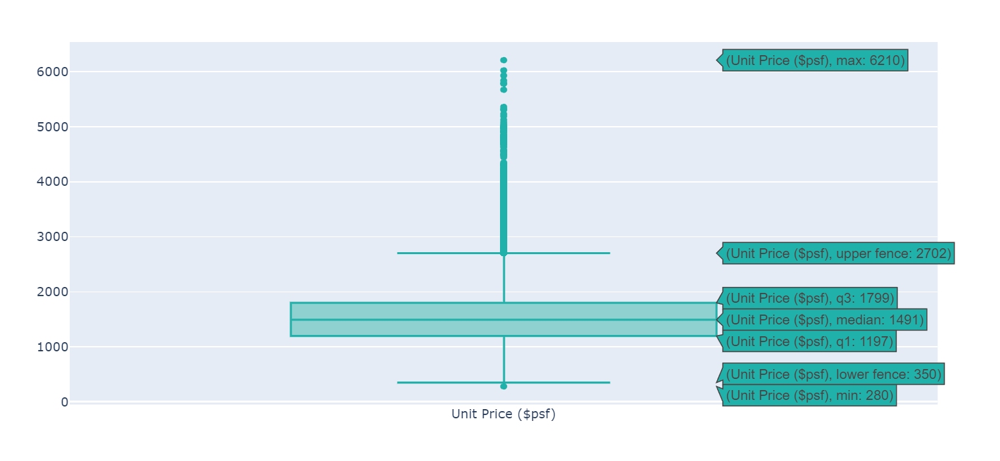


In [53]:
# Use Plotly to analyze the Unit Price ($psf) - 2017 to 2022 dataset
#trace0_2_overall = go.Box(y = df_singapore_condo_apt_data['Unit Price ($psf)'], 
                #name = 'Unit Price ($psf)', marker_color = 'lightseagreen',
                
                #boxpoints = 'all',  # see the actual points which make up our data for the box plot
                
                #boxmean = True  # draw dotted line for the mean                 
               #)

In [54]:
#data = [trace0_2_overall]

#offline.iplot(data)

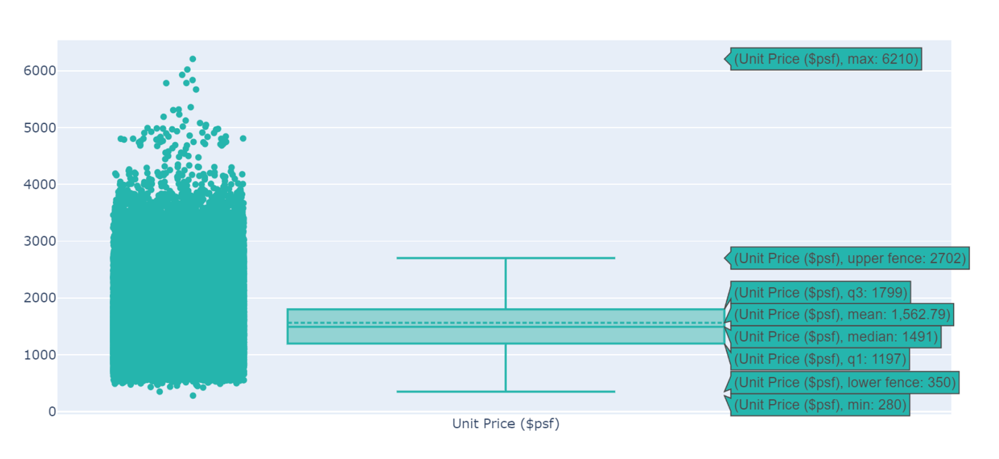

### 2017 -  Use Plotly to analyze the Unit Price ($psf) 

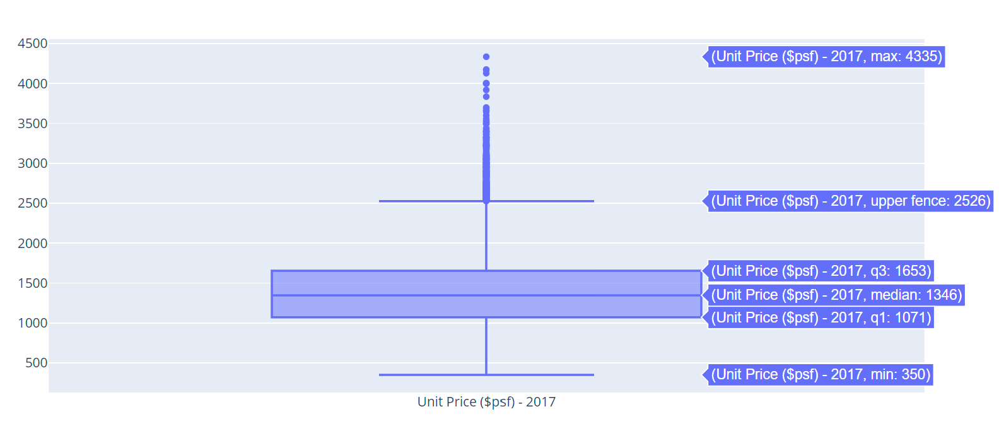
- https://plotly.com/~ab.rauf/41/

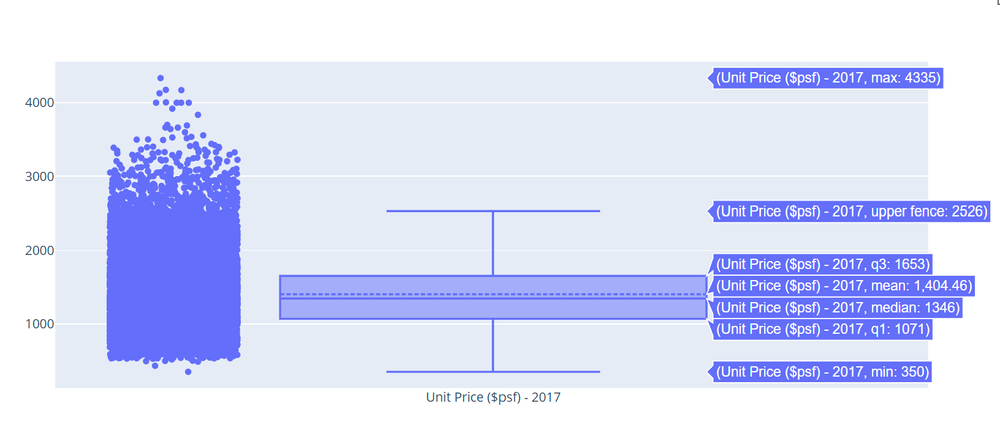

- https://plotly.com/~ab.rauf/43/

### 2018 -  Use Plotly to analyze the Unit Price ($psf) 

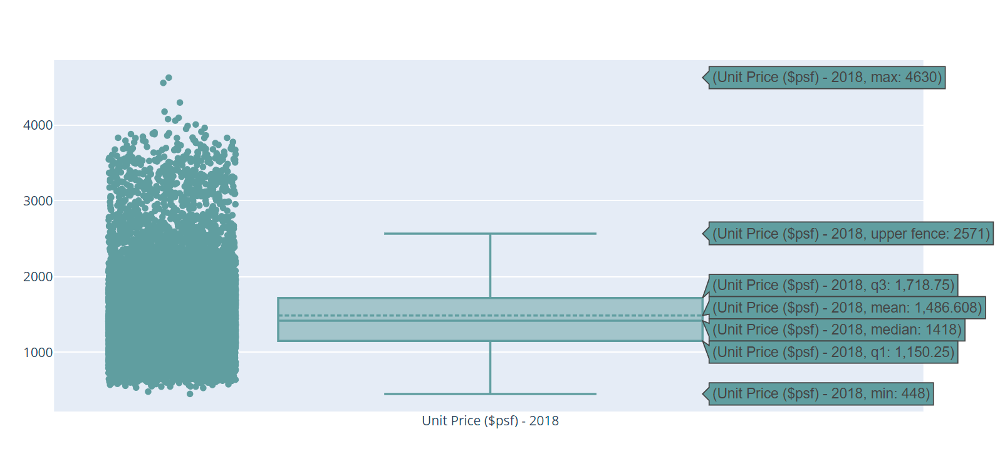

- https://plotly.com/~ab.rauf/24/

### 2019

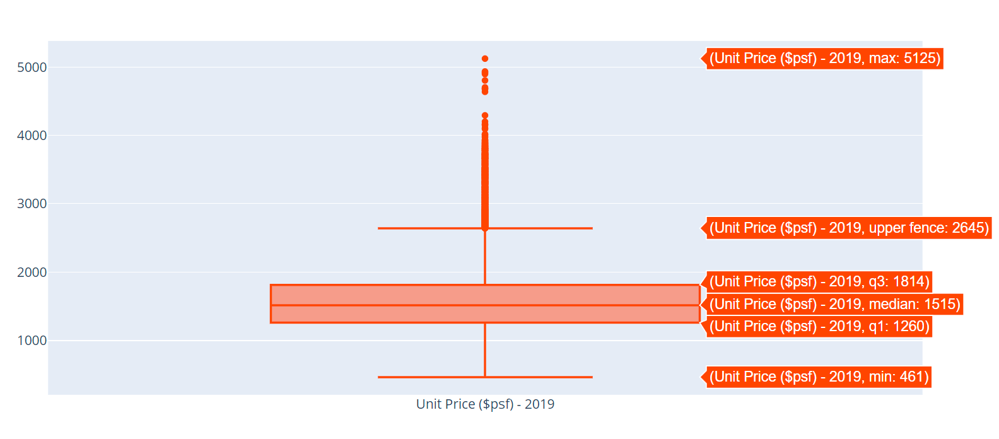

- https://plotly.com/~ab.rauf/28/

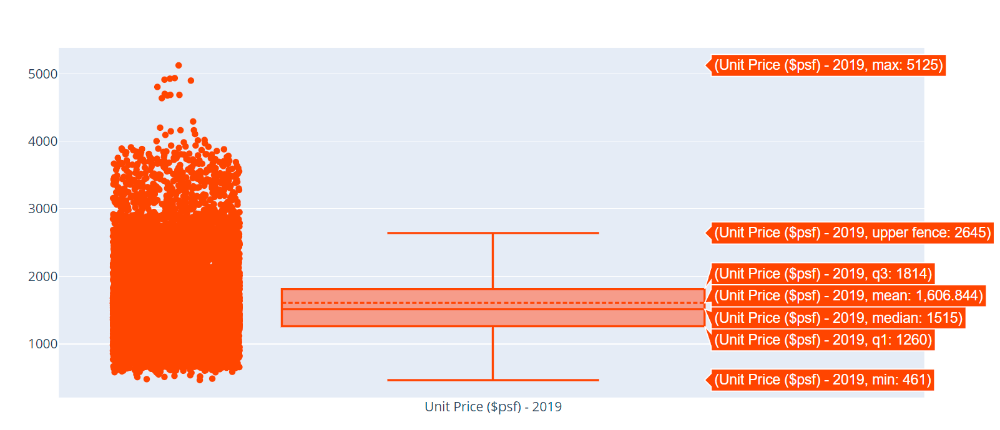
- https://plotly.com/~ab.rauf/30/

### 2020

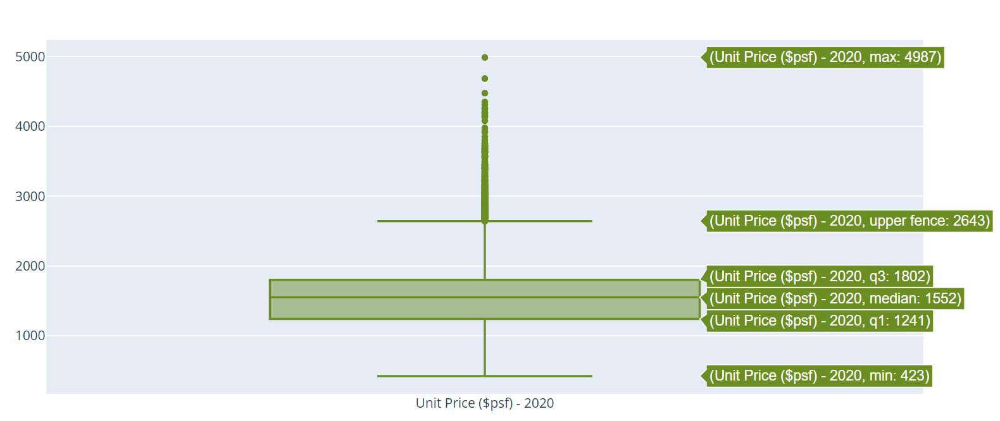

- https://plotly.com/~ab.rauf/33/

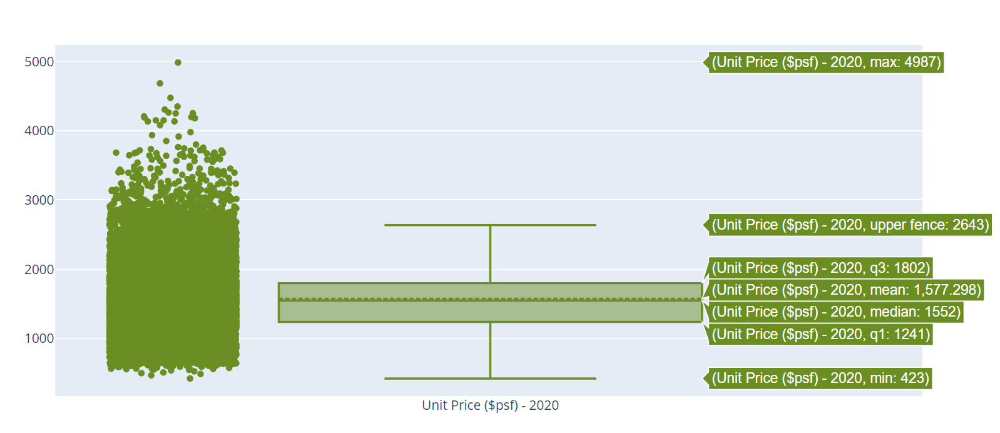
- https://plotly.com/~ab.rauf/35/

### 2021

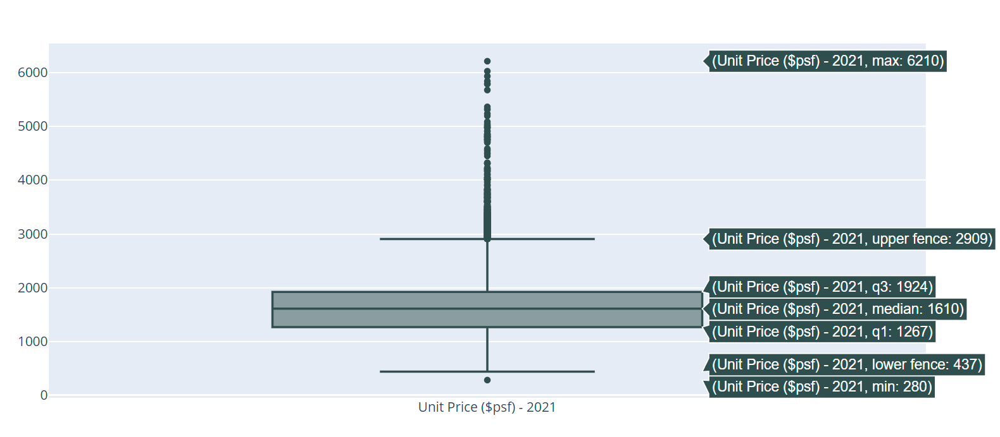

- https://plotly.com/~ab.rauf/37/

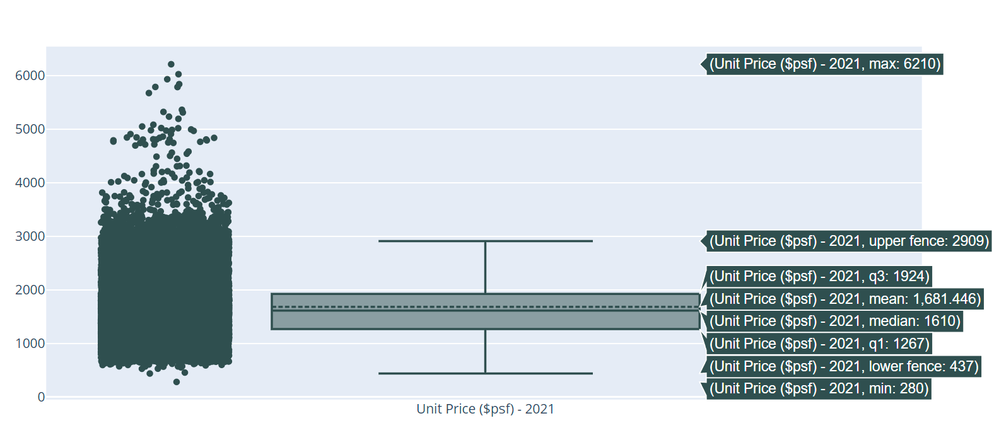
- https://plotly.com/~ab.rauf/39/

## Use Plotly to analyze and compare the Unit Price ($psf) through the 5 years with outliers


In [55]:
# Use Plotly to analyze and compare the Unit Price ($psf) through the 5 years with outliers
#data = [trace0_1_overall,trace1_1_2017, trace2_1_2018, trace3_1_2019, trace4_1_2020, trace5_1_2021]

#offline.iplot(data)

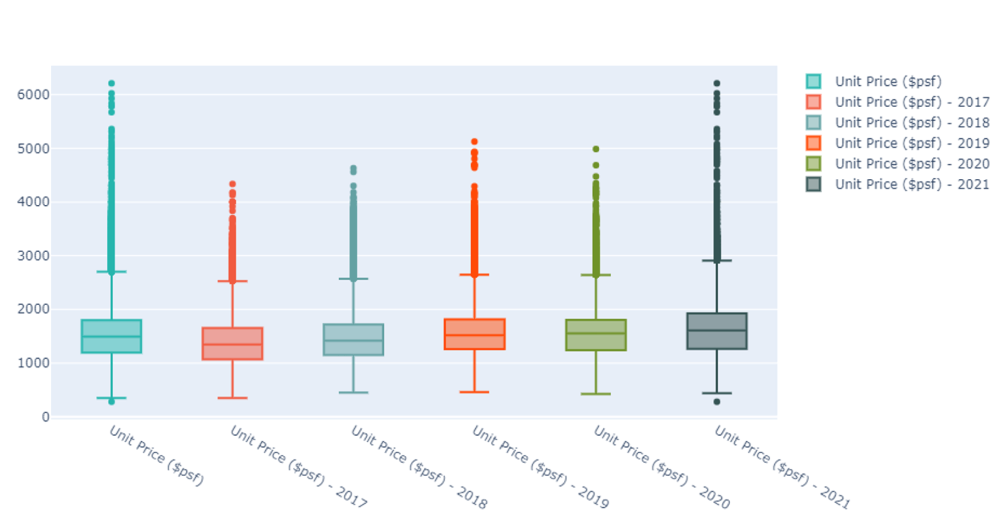

In [56]:
#data = [trace0_2_overall,trace1_2_2017, trace2_2_2018, trace3_2_2019, trace4_2_2020, trace5_2_2021]

#offline.iplot(data)

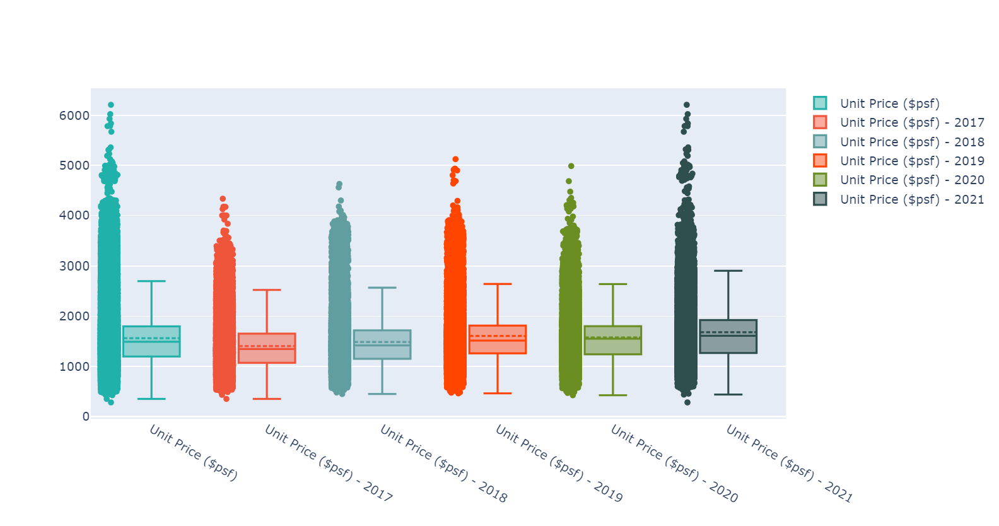

## Study the trend and find the % change in median Unit Price ($psf) for frequency range of 3 months.

In [57]:
#Resampling for a frequency of 3 months
grouper = df_singapore_condo_apt_data.groupby(pd.Grouper(key="Date of Sale",  freq="3M"))
grouper

In [58]:
grouper.head()

,Project Name,Street Name,Type,Postal District,Market Segment,Tenure,Type of Sale,No. of Units,Price ($),Nett Price ($),Area (Sqft),Type of Area,Floor Level,Unit Price ($psf),Date of Sale,Year,Month
36562,ARDMORE THREE,ARDMORE PARK,Condominium,10,CCR,Freehold,Resale,1,6543555,-,1787,Strata,26 to 30,3662,2017-02-01,2017,2
36658,ARDMORE PARK,ARDMORE PARK,Condominium,10,CCR,Freehold,Resale,1,9500000,-,2885,Strata,21 to 25,3293,2017-02-01,2017,2
36597,OUE TWIN PEAKS,LEONIE HILL ROAD,Condominium,9,CCR,99 yrs lease commencing from 2010,Resale,1,1760100,-,549,Strata,31 to 35,3206,2017-02-01,2017,2
36567,OUE TWIN PEAKS,LEONIE HILL ROAD,Condominium,9,CCR,99 yrs lease commencing from 2010,Resale,1,1725500,-,549,Strata,26 to 30,3143,2017-02-01,2017,2
36609,OUE TWIN PEAKS,LEONIE HILL ROAD,Condominium,9,CCR,99 yrs lease commencing from 2010,Resale,1,1791600,-,570,Strata,26 to 30,3140,2017-02-01,2017,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21278,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,35000000,-,6049,Strata,01 to 05,5786,2021-12-01,2021,12
21345,LES MAISONS NASSIM,NASSIM ROAD,Condominium,10,CCR,Freehold,New Sale,1,37000000,-,6523,Strata,01 to 05,5672,2021-12-01,2021,12
21330,PARK NOVA,TOMLINSON ROAD,Apartment,10,CCR,Freehold,New Sale,1,10479000,-,2207,Strata,06 to 10,4749,2021-12-01,2021,12
21241,TWENTYONE ANGULLIA PARK,ANGULLIA PARK,Condominium,9,CCR,Freehold,Resale,1,10138000,-,2260,Strata,31 to 35,4485,2021-12-01,2021,12


## Median Resampling - Unit Price ($psf)

In [59]:
med_gp = grouper.median() #median value
med_gp

,Postal District,No. of Units,Price ($),Area (Sqft),Unit Price ($psf),Year,Month
Date of Sale,,,,,,,
2017-02-28,10.0,1.0,1164240.0,980.0,1311.0,2017.0,2.0
2017-05-31,15.0,1.0,1229999.0,958.0,1385.0,2017.0,4.0
2017-08-31,14.0,1.0,1275060.0,1023.0,1332.5,2017.0,7.0
2017-11-30,15.0,1.0,1290000.0,1033.0,1334.0,2017.0,10.0
2018-02-28,15.0,1.0,1312000.0,1087.0,1315.0,2018.0,2.0
2018-05-31,15.0,1.0,1268888.0,990.0,1390.0,2018.0,4.0
2018-08-31,14.0,1.0,1210000.0,893.0,1449.0,2018.0,7.0
2018-11-30,15.0,1.0,1254000.0,904.0,1526.5,2018.0,10.0
2019-02-28,14.0,1.0,1280000.0,947.0,1460.0,2019.0,2.0


In [60]:
med_gp = med_gp.drop(med_gp.index[20]) #drop 2022 as our analysis is from 2017 to 2021 for median resampling
med_gp

,Postal District,No. of Units,Price ($),Area (Sqft),Unit Price ($psf),Year,Month
Date of Sale,,,,,,,
2017-02-28,10.0,1.0,1164240.0,980.0,1311.0,2017.0,2.0
2017-05-31,15.0,1.0,1229999.0,958.0,1385.0,2017.0,4.0
2017-08-31,14.0,1.0,1275060.0,1023.0,1332.5,2017.0,7.0
2017-11-30,15.0,1.0,1290000.0,1033.0,1334.0,2017.0,10.0
2018-02-28,15.0,1.0,1312000.0,1087.0,1315.0,2018.0,2.0
2018-05-31,15.0,1.0,1268888.0,990.0,1390.0,2018.0,4.0
2018-08-31,14.0,1.0,1210000.0,893.0,1449.0,2018.0,7.0
2018-11-30,15.0,1.0,1254000.0,904.0,1526.5,2018.0,10.0
2019-02-28,14.0,1.0,1280000.0,947.0,1460.0,2019.0,2.0


In [61]:
med_gp.reset_index()
med_gp.head()

,Postal District,No. of Units,Price ($),Area (Sqft),Unit Price ($psf),Year,Month
Date of Sale,,,,,,,
2017-02-28,10.0,1.0,1164240.0,980.0,1311.0,2017.0,2.0
2017-05-31,15.0,1.0,1229999.0,958.0,1385.0,2017.0,4.0
2017-08-31,14.0,1.0,1275060.0,1023.0,1332.5,2017.0,7.0
2017-11-30,15.0,1.0,1290000.0,1033.0,1334.0,2017.0,10.0
2018-02-28,15.0,1.0,1312000.0,1087.0,1315.0,2018.0,2.0


In [62]:
med_gp.index = ['Q1-2017', ' Q2-2017', 'Q3-2017', 'Q4-2017',
                'Q1-2018', ' Q2-2018', 'Q3-2018', 'Q4-2018', 
                'Q1-2019', ' Q2-2019', 'Q3-2019', 'Q4-2019',
                'Q1-2020', ' Q2-2020', 'Q3-2020', 'Q4-2020',
                'Q1-2021', ' Q2-2021', 'Q3-2021', 'Q4-2021',]
med_gp.head()

,Postal District,No. of Units,Price ($),Area (Sqft),Unit Price ($psf),Year,Month
Q1-2017,10.0,1.0,1164240.0,980.0,1311.0,2017.0,2.0
Q2-2017,15.0,1.0,1229999.0,958.0,1385.0,2017.0,4.0
Q3-2017,14.0,1.0,1275060.0,1023.0,1332.5,2017.0,7.0
Q4-2017,15.0,1.0,1290000.0,1033.0,1334.0,2017.0,10.0
Q1-2018,15.0,1.0,1312000.0,1087.0,1315.0,2018.0,2.0


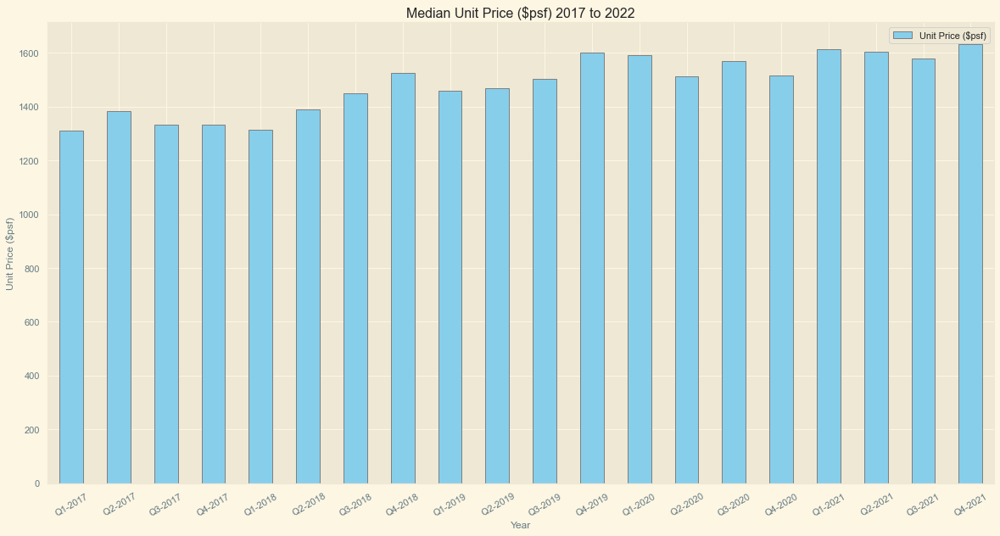

In [63]:
# Plot Median Unit Price ($psf) bar graph
med_gp.plot(kind='bar', y = 'Unit Price ($psf)', color = "skyblue", ec="grey", figsize=(20,10), rot =30, title= "Median Unit Price ($psf) 2017 to 2022")
plt.xlabel('Year')
plt.ylabel('Unit Price ($psf)')
plt.show()

In [64]:
# Percent Change - median
med_p_change = med_gp.pct_change()
med_p_change.head()

,Postal District,No. of Units,Price ($),Area (Sqft),Unit Price ($psf),Year,Month
Q1-2017,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Q2-2017,0.500000,0.0,0.056482,-0.022449,0.056445,0.000000,1.000000
Q3-2017,-0.066667,0.0,0.036635,0.067850,-0.037906,0.000000,0.750000
Q4-2017,0.071429,0.0,0.011717,0.009775,0.001126,0.000000,0.428571
Q1-2018,0.000000,0.0,0.017054,0.052275,-0.014243,0.000496,-0.800000


In [65]:
# converting percentage change
convert_perc = med_p_change['Unit Price ($psf)']*100
convert_perc.head()

Q1-2017          NaN
 Q2-2017    5.644546
Q3-2017    -3.790614
Q4-2017     0.112570
Q1-2018    -1.424288
Name: Unit Price ($psf), dtype: float64

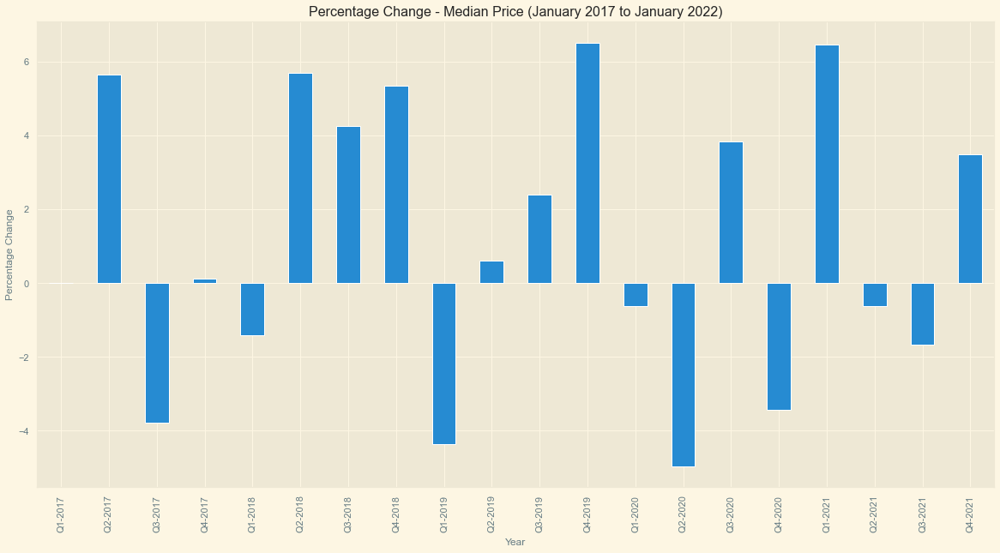

In [66]:
convert_perc.plot(kind='bar', y = "Unit Price ($psf)",figsize=(20,10),  title = "Percentage Change - Median Price (January 2017 to January 2022)")
plt.xlabel('Year')
plt.ylabel('Percentage Change')
plt.show()

## Other Observations from data analysis

## Pairplot Analysis

- 'The Type' in terms of either Apartment or Condominium has been chosen in Pairplot Analysis.
- One such observation is for the Unit($psf), we can observe there are more apartments than condominiums for number of transactions within the districts


In [ ]:
# Using pairplot to analyze Unit price($psf) 
# sns.pairplot(df_singapore_condo_apt_data, hue='Type', palette='coolwarm')

## Scatter Plot Observation 

In [ ]:
# Dataframe with conditions created for better visualization 
#df_unit_v_pr = df_singapore_condo_apt_data[(df_singapore_condo_apt_data['Price ($)'].between(0,10000000, inclusive = True) & 
                                      #(df_singapore_condo_apt_data['Area (Sqft)'].between(0,6000, inclusive = True)))]
#df_unit_v_pr.head()

In [ ]:
# Unit Price($psf) versus Price in the data analysis (Scatter Plot)
#sns.lmplot(y='Area (Sqft)', x='Price ($)', data=df_unit_v_pr,hue = "Type", palette= 'coolwarm', height=10, aspect=1.5)

In [ ]:
# Unit Price($psf) versus Unit Price in the data analysis (Scatter Plot)
#sns.lmplot(y='Area (Sqft)', x='Unit Price ($psf)', data=df_unit_v_pr,hue = "Type", palette= 'coolwarm', height=10, aspect=1.5)